In [1]:
# !pip install pygraphviz
import networkx as nx
from mycolors import *
from avalia import *
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from networkx.algorithms import community
from networkx.generators.community import planted_partition_graph
from fcmeans import FCM
from LPA_Fuzzy import *
from scipy.sparse.linalg import eigs
from sklearn.mixture import GaussianMixture
from networkx.algorithms.community import k_clique_communities
from GraphSage import *
from gem.embedding.gf       import GraphFactorization
from gem.embedding.hope     import HOPE
from gem.embedding.lap      import LaplacianEigenmaps
from gem.embedding.lle      import LocallyLinearEmbedding
from gem.embedding.node2vec import node2vec
from gem.embedding.sdne     import SDNE

In [36]:
G = nx.readwrite.edgelist.read_weighted_edgelist("/home/felipe/UFRJ/TCC/MVP/package1/binary_networks/network.dat",nodetype=int)

In [37]:
G = nx.relabel_nodes(G,lambda x: x-1)

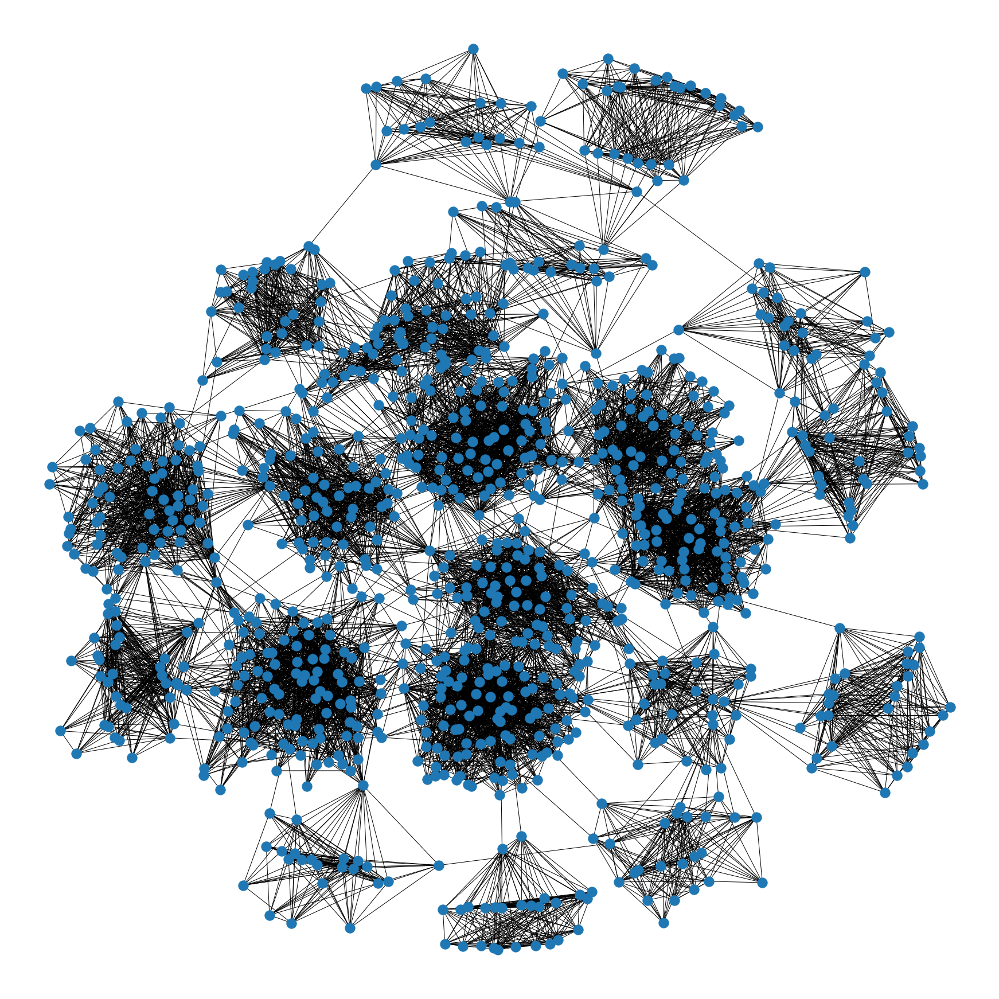

In [4]:
plt.figure(figsize=(24,24))
pos = nx.nx_agraph.graphviz_layout(G)
nx.draw(G,pos=pos)

In [8]:
k = 2
G2 = planted_partition_graph(k,1000,0.1,0.0001,seed=42)
groundTruth = [(node,data["block"]) for node,data in dict(G2.nodes.data()).items()]
node_belongings = getBelongings(G2)
true_labels = np.array(groundTruth)[:,1]

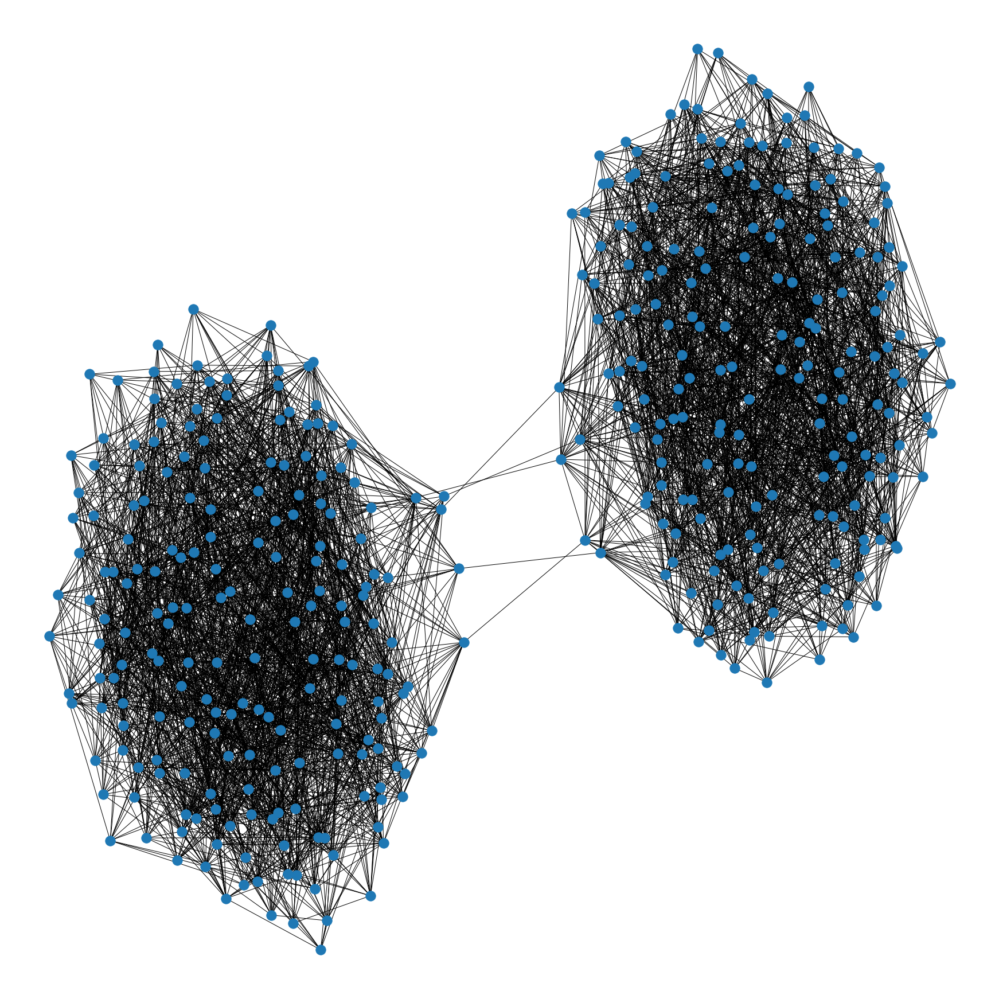

In [33]:
plt.figure(figsize=(24,24))
pos = nx.nx_agraph.graphviz_layout(G2)
nx.draw(G2,pos=pos)

In [10]:
result = gam_method(G2,maxiter=200)

In [12]:
gam_s = result['labels'].astype(int, copy=False)

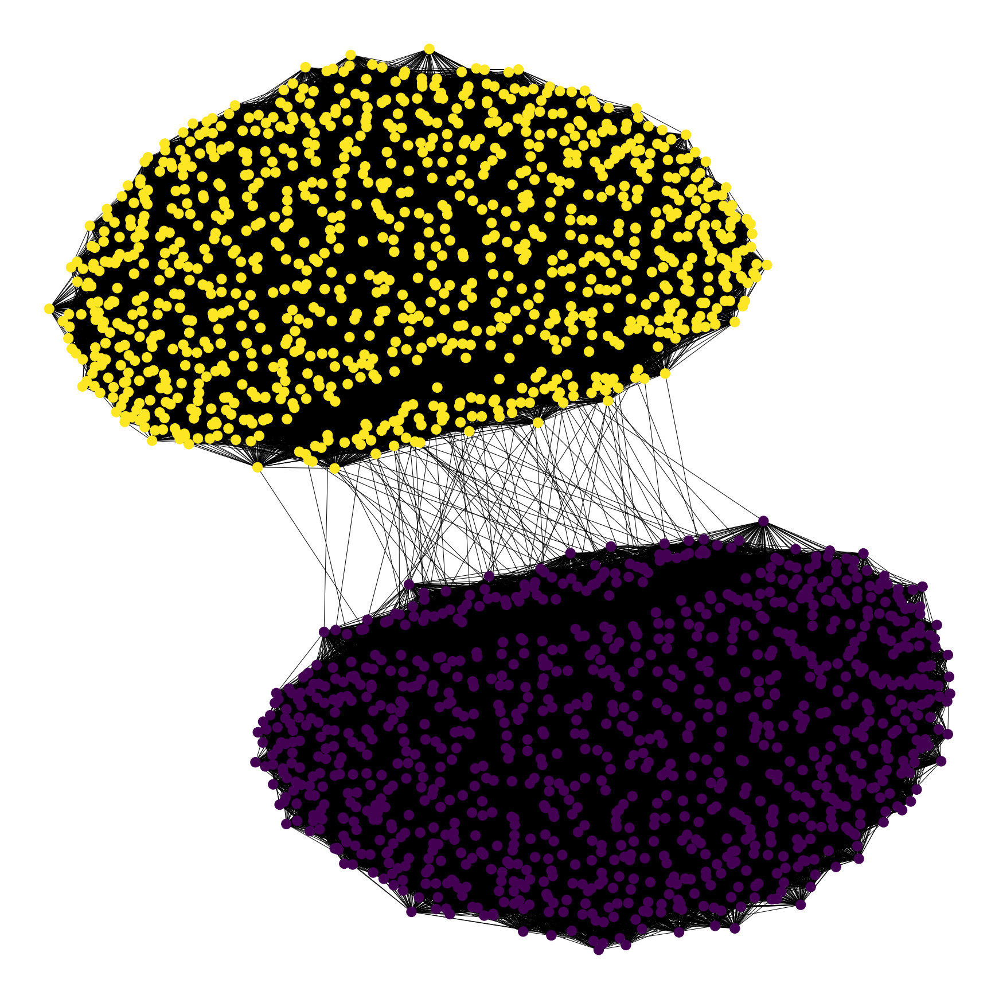

In [15]:
plt.figure(figsize=(24,24))
pos = nx.nx_agraph.graphviz_layout(G2)
nx.draw(G2,pos=pos,node_color=gam_s)

In [17]:
acc(gam_s,true_labels)

1.0

# Label Propagation até D = 5

In [12]:
def get_vectorized_transform(d):
	def func(x):
		return np.max([1 - x/(d+1),0])
	transform_dist = np.vectorize(func)
	return transform_dist
func = get_vectorized_transform(5)

In [10]:
dist = LPA_Fuzzy(G2,5)
#A = nx.linalg.graphmatrix.adjacency_matrix(G2).toarray()
#dist = np.linalg.matrix_power(A,3)

In [11]:
dist = dist.astype(np.float16)

In [14]:
dist = func(dist)

# Com Fuzzy C Means

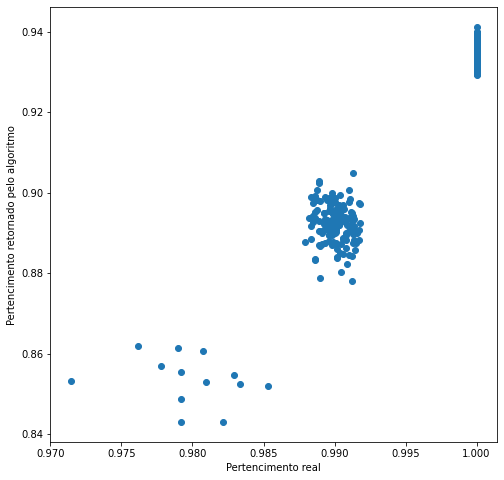

In [15]:
fcm = FCM(n_clusters=k)
fcm.fit(dist)


soft_labels = fcm.soft_predict(dist)
makeStructuralPlot(soft_labels,node_belongings)
plt.show()

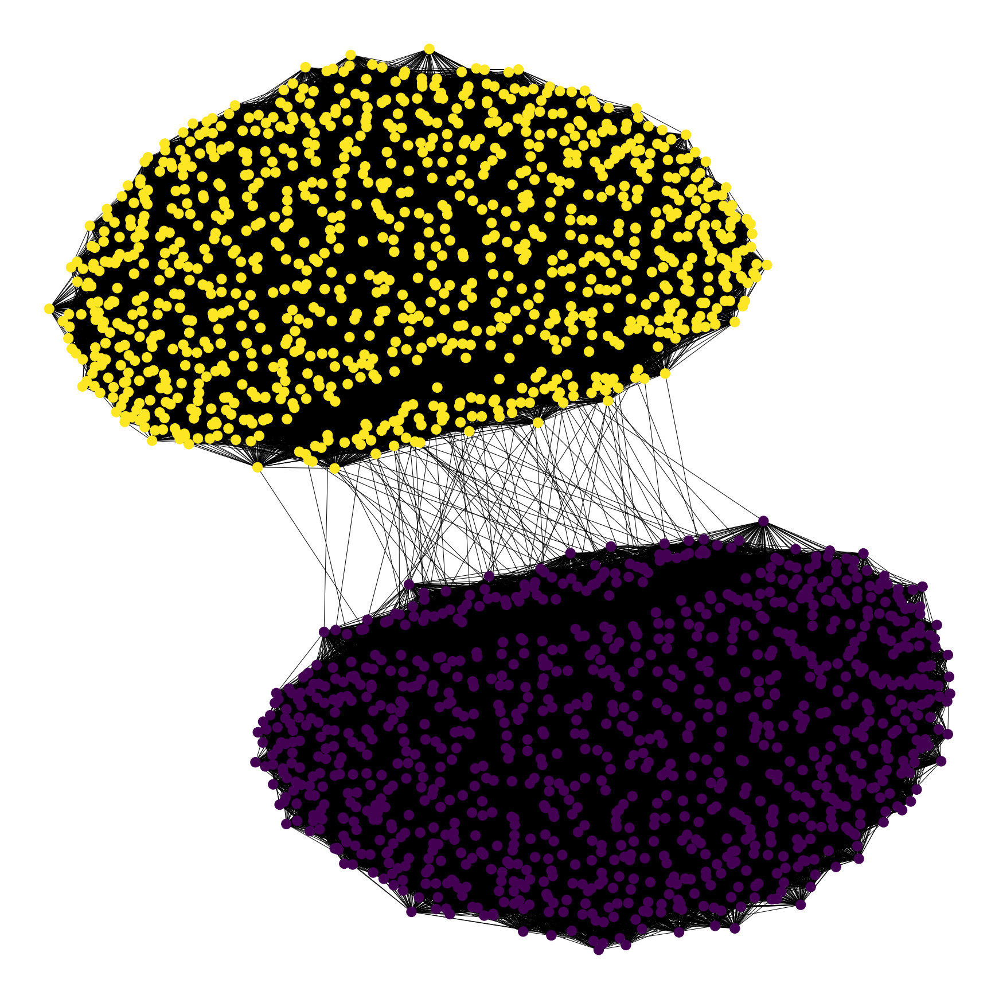

In [16]:
plt.figure(figsize=(24,24))
pos = nx.nx_agraph.graphviz_layout(G2)
nx.draw(G2,pos=pos, node_color=np.argmax(soft_labels,axis=1))

# Com GMM

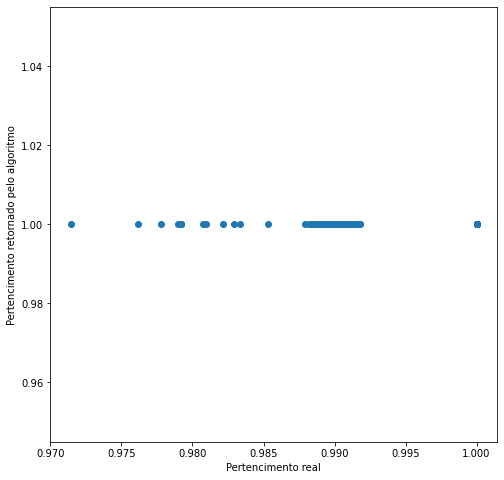

In [23]:
model = GaussianMixture(n_components=k,covariance_type='full')
model.fit(dist)
gmm_labels = model.predict_proba(dist)
makeStructuralPlot(gmm_labels,node_belongings)
plt.show()

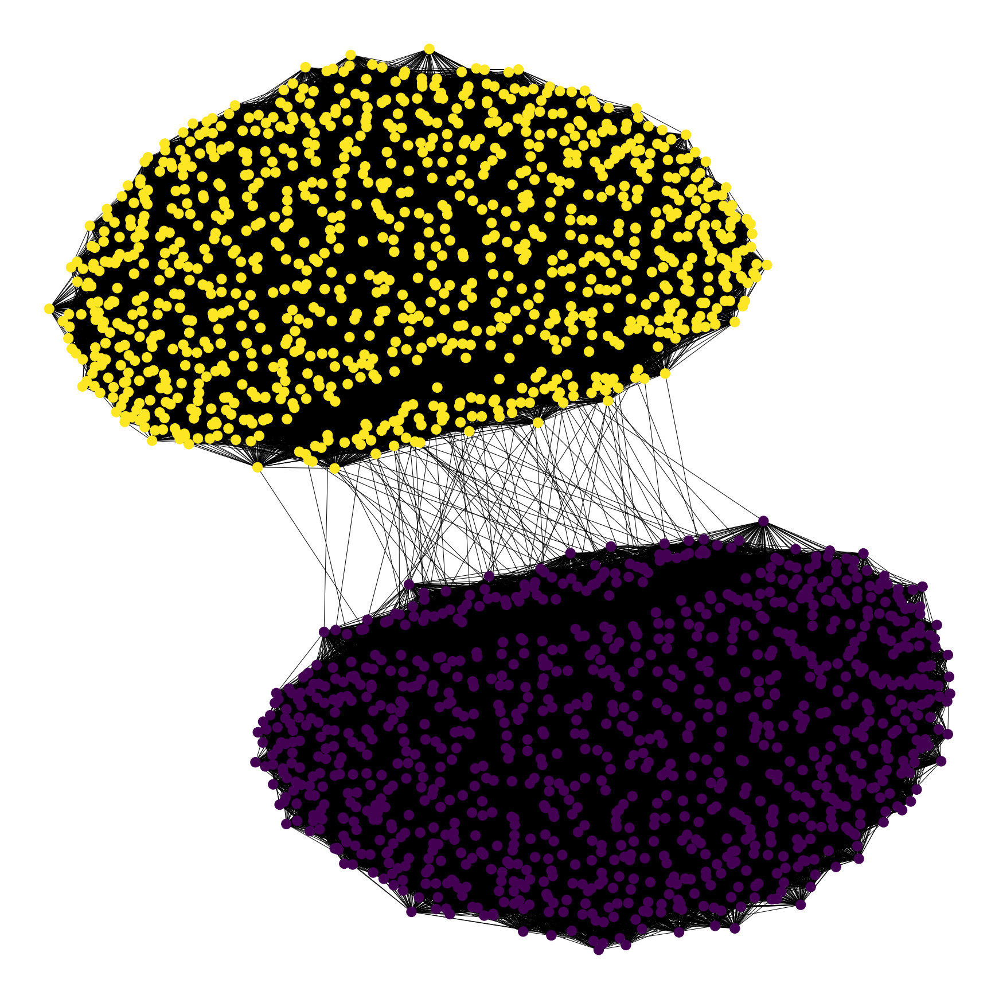

In [34]:
plt.figure(figsize=(24,24))
pos = nx.nx_agraph.graphviz_layout(G2)
nx.draw(G2,pos=pos, node_color=np.argmax(gmm_labels,axis=1))

# Spectral Clustering

In [9]:
L = nx.linalg.laplacianmatrix.laplacian_matrix(G2).toarray()
L = L.astype(np.float32)
vals = vecs = 0
vals, vecs = eigs(L, k=(k+1), which='SM', maxiter=5000)

In [10]:
vecs

array([[-1.8257394e-02+0.j,  2.1476712e-02+0.j,  1.4454613e-02+0.j,
         3.7403831e-03+0.j],
       [-1.8257394e-02+0.j,  2.1480860e-02+0.j,  1.4473691e-02+0.j,
        -5.3380709e-03+0.j],
       [-1.8257396e-02+0.j,  2.1497123e-02+0.j,  1.4472881e-02+0.j,
         5.0097113e-03+0.j],
       ...,
       [-1.8257510e-02+0.j,  1.7859910e-03+0.j, -2.5821015e-02+0.j,
        -1.8999181e-05+0.j],
       [-1.8257512e-02+0.j,  1.7696531e-03+0.j, -2.5832716e-02+0.j,
         2.7179318e-05+0.j],
       [-1.8257510e-02+0.j,  1.7780978e-03+0.j, -2.5855023e-02+0.j,
         1.1661467e-05+0.j]], dtype=complex64)

In [11]:
vals

array([-7.9274178e-06+0.j,  2.7772114e-01+0.j,  2.9291168e-01+0.j,
        6.8207130e+01+0.j], dtype=complex64)

In [12]:
U = np.delete(vecs,np.argmin(vals),1)

## Com Fuzzy C Means

In [13]:
fcm = FCM(n_clusters=k)
fcm.fit(U)

/home/felipe/anaconda3/lib/python3.8/site-packages/matplotlib/collections.py:206: ComplexWarning: Casting complex values to real discards the imaginary part
  offsets = np.asanyarray(offsets, float)


Text(0.5, 1.0, 'n_clusters = 3, PC = 0.321+0.000j, PEC = 0.036-0.000j')

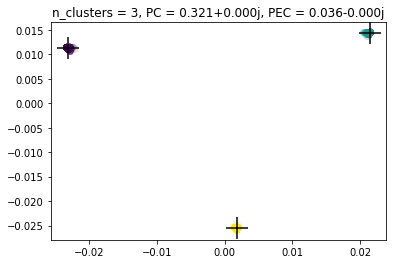

In [14]:
pc = fcm.partition_coefficient
pec = fcm.partition_entropy_coefficient
    
fcm_centers = fcm.centers
fcm_labels = fcm.predict(U)
# plot result
plt.scatter(U[:,0], U[:,1], c=fcm_labels, alpha=.1)
plt.scatter(fcm_centers[:,0], fcm_centers[:,1], marker="+", s=500, c='black')
plt.title(f'n_clusters = 3, PC = {pc:.3f}, PEC = {pec:.3f}')

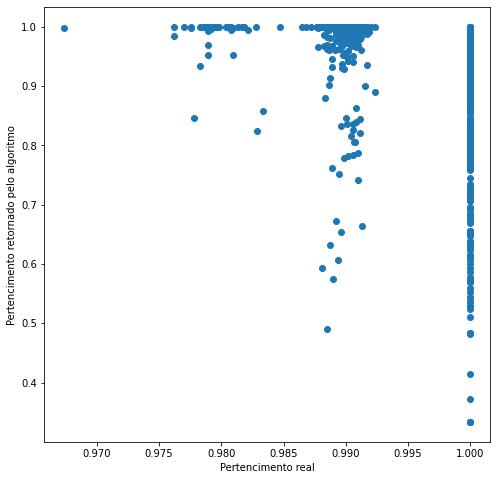

In [15]:
soft_labels = fcm.soft_predict(U)
makeStructuralPlot(soft_labels,node_belongings)
plt.show()

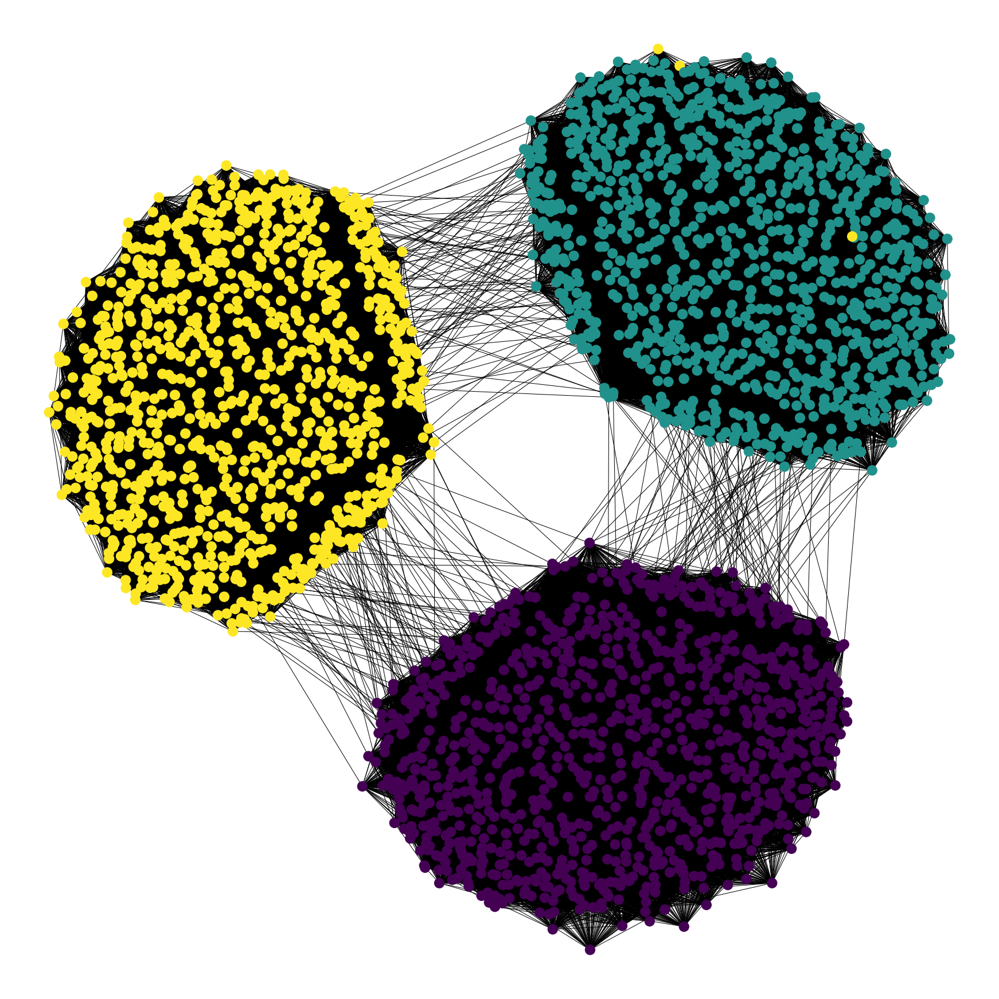

In [16]:
plt.figure(figsize=(24,24))
pos = nx.nx_agraph.graphviz_layout(G2)
nx.draw(G2,pos=pos, node_color=np.argmax(soft_labels,axis=1))

## Com GMM

In [17]:
model = GaussianMixture(n_components=k,covariance_type='full')

In [18]:
model.fit(U.real)

GaussianMixture(n_components=3)

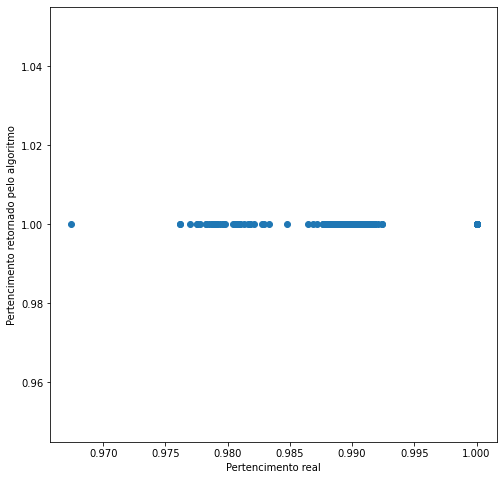

In [19]:
gmm_labels = model.predict_proba(U.real)
makeStructuralPlot(gmm_labels,node_belongings)
plt.show()

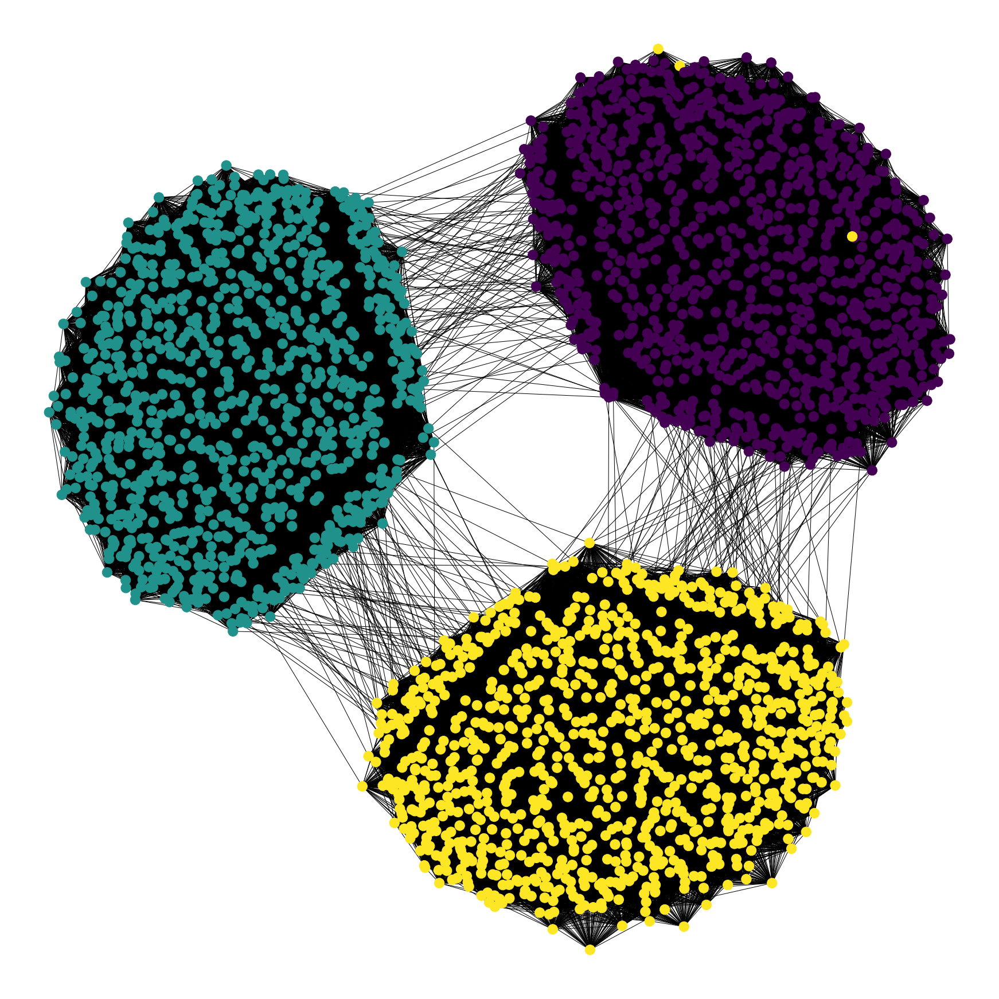

In [20]:
plt.figure(figsize=(24,24))
pos = nx.nx_agraph.graphviz_layout(G2)
nx.draw(G2,pos=pos, node_color=np.argmax(gmm_labels,axis=1))

In [21]:
np.bincount(np.argmax(gmm_labels,axis=1))

array([ 999, 1001])

In [5]:
G2_c = nx.convert_node_labels_to_integers(G2)

In [6]:
c = list(k_clique_communities(G2_c, 3))

In [7]:
'block' in G2_c.nodes[0]

True

In [8]:
clique_labels =  getKCliqueBelongings(G2,c)
structure_found = np.max(clique_labels,axis=1)
structure_found

array([1., 1., 1., ..., 1., 1., 1.])

In [9]:
clique_labels

array([[1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       ...,
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.]])

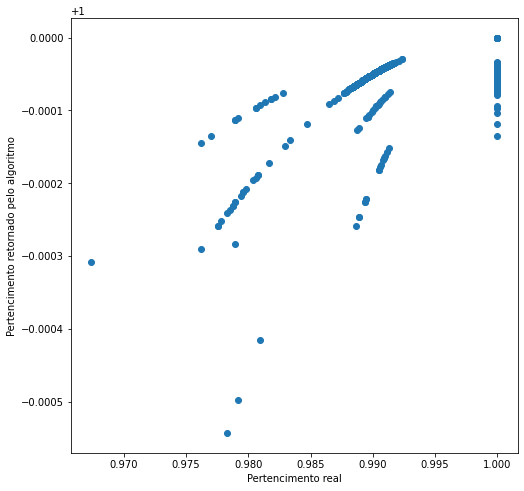

In [11]:
makeStructuralPlot(clique_labels,node_belongings)
plt.show()

In [12]:
acc(clique_labels,true_labels)

1.0

# Graph Neural Networks

In [12]:
X = getEmbeddings(G2,hidden_channels=64,epochs=50,mode='one_hot')

In [13]:
X.shape

(3000, 64)

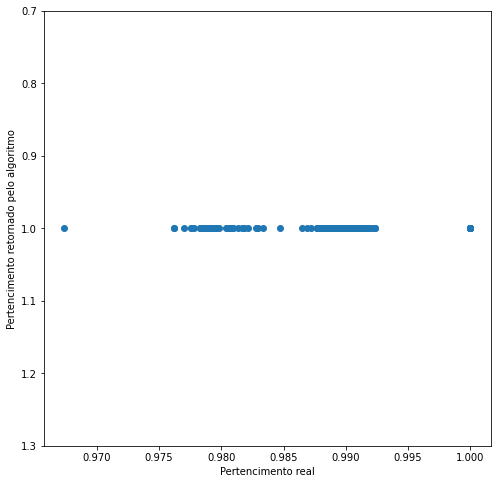

In [14]:
model = GaussianMixture(n_components=k,covariance_type='full')
model.fit(X)
gmm_labels = model.predict_proba(X)
makeStructuralPlot(gmm_labels,node_belongings)
plt.ylim(1.3,0.7)
plt.show()

In [8]:
acc(gmm_labels,true_labels)

1.0

In [7]:
X.real

array([[ 0.02124564,  0.01126793,  0.04908228, ...,  0.00798932,
         0.02454032,  0.00296123],
       [ 0.02239407,  0.02003695,  0.05339579, ..., -0.01627865,
        -0.03280059, -0.00019068],
       [ 0.02263534,  0.02092022, -0.02595423, ..., -0.00166681,
         0.01489503,  0.01130346],
       ...,
       [-0.02173515, -0.00266925,  0.00709573, ...,  0.06831259,
        -0.0435426 ,  0.00105628],
       [-0.02342813,  0.00013081, -0.00538113, ...,  0.04057248,
        -0.03365606,  0.05413176],
       [-0.0225479 , -0.00083918, -0.00281368, ...,  0.00188312,
        -0.00328187,  0.02885892]])

# Other Embedding Techniques

Laplacian matrix recon. error (low rank): 44.462462
Acc: 1.0


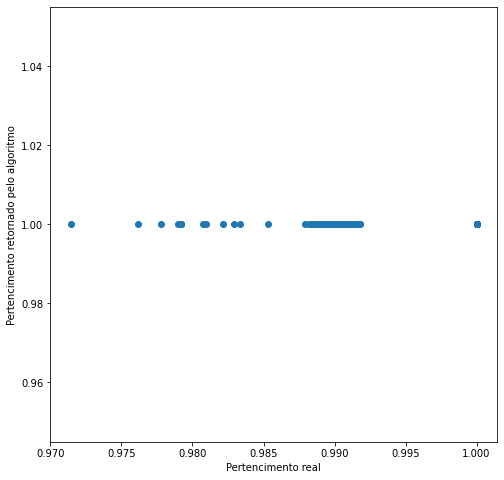

Acc: 1.0


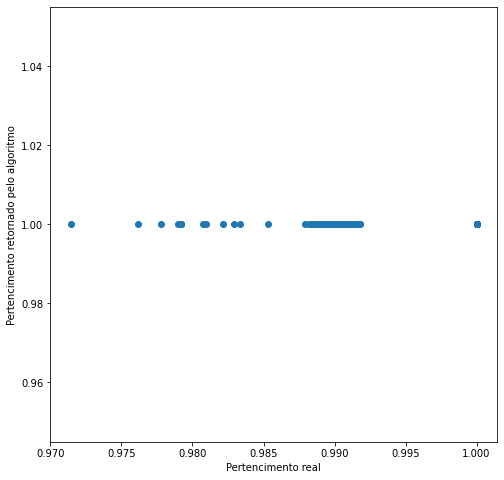

		Iter id: 0, Objective: 99897.3, f1: 99884.5, f2: 12.7777
Acc: 0.5065


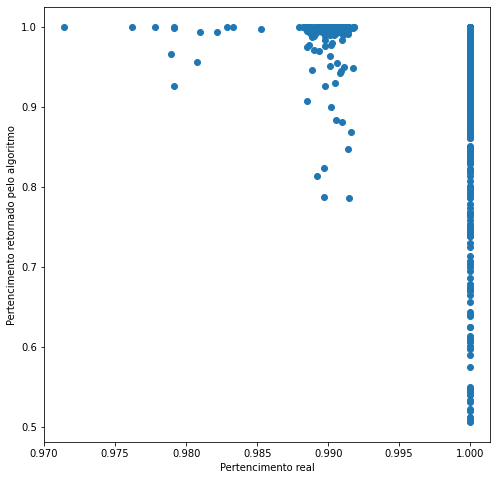

SVD error (low rank): 4.172147
Acc: 1.0


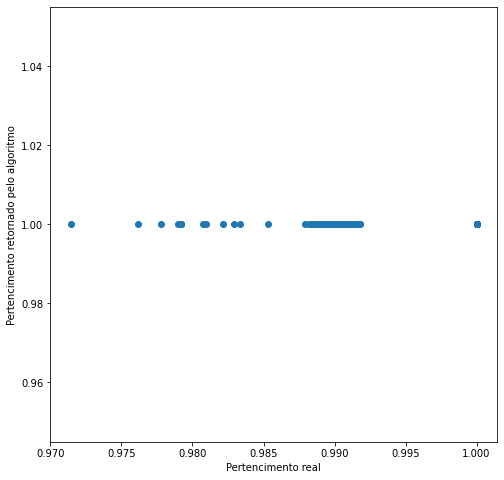

In [4]:
models = [
            LaplacianEigenmaps(d=64),
            LocallyLinearEmbedding(d=64),
            GraphFactorization(d=64,max_iter=1000, eta=110**-4, regu=1.0),
            HOPE(d=64,beta=0.01)
        ]
model = GaussianMixture(n_components=k,covariance_type='full')
for embedding in models:
    X, t = embedding.learn_embedding(graph=G2, edge_f=None, is_weighted=False, no_python=False)
    X = embedding.get_embedding()
    X = X.real
    model.fit(X)
    gmm_labels = model.predict_proba(X)
    makeStructuralPlot(gmm_labels,node_belongings)
    print(f'Acc: {acc(gmm_labels,true_labels)}')
    plt.show()

In [6]:
nx.readwrite.edgelist.write_edgelist(G2,"/home/felipe/UFRJ/TCC/snap-0b73cda5f0c9f0dcfd47172eea8be26ba414941a/examples/node2vec/G2.edgelist")

In [23]:
X = np.zeros((len(G2),64))
with open("G2.emb","r") as f:
    line = f.readline()
    line = f.readline()
    while line != '':  # The EOF char is an empty string
        tokens = line[:-1].split(" ")
        X[int(tokens[0]),:] = np.array(tokens[1:],dtype=np.float16)
        line = f.readline()

Acc: 0.503


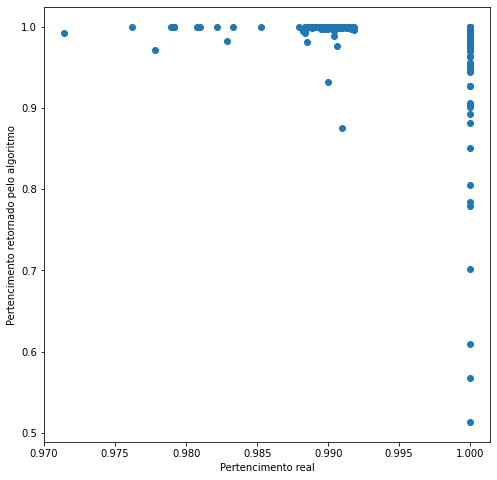

In [26]:
model.fit(X)
gmm_labels = model.predict_proba(X)
makeStructuralPlot(gmm_labels,node_belongings)
print(f'Acc: {acc(gmm_labels,true_labels)}')
plt.show()